# TCGA RNA-seq Data Analysis Report

## Introduction

This notebook outlines the data pre-processing steps performed for the breast cancer study case using the Metabopathia tool. The workflow begins with a Principal Component Analysis ([PCA](https://doi.org/10.1038/s43586-023-00209-y)) to assess data quality and establish criteria for selecting clear RNA-seq data for downstream analysis. Following this, gene expression normalization was carried out using the trimmed mean of M-values ([TMM](https://doi.org/10.1186/gb-2010-11-3-r25)) method. After normalization, the data were log-transformed, and truncation was applied at the 99th percentile to manage outliers. To address batch effects, the [ComBat](https://doi.org/10.1093/biostatistics/kxj037) method was employed.

The RNA-seq data for this study were obtained from Breast Invasive Carcinoma (BRCA) [\[1\]](https://doi.org/10.1038/nature11412),[\[2\]](https://doi.org/10.1016/j.cell.2015.09.033), sourced from The Cancer Genome Atlas ([TCGA](https://tcga-data.nci.nih.gov/tcga/)) data portal. These data include RNA-seq counts for both healthy control and cancer samples, ensuring a comprehensive dataset for analysis.


## Loading Libraries and sourcing needed files 

In [8]:
# Source utils.R file: where functions are pre-definded:
source("utils.R")

# Define packages
cran_packages <- c("ggplot2", "dplyr", "tibble", "data.table", "FactoMineR", "factoextra", "mixOmics", "tidyverse", "see","plotly")# TODO: Here have to pay att with libraries conflicts
bioc_packages <- c("SummarizedExperiment", "SEtools", "edgeR") #EDASeq

# Call the function to install or load packages
check_and_install(cran_packages, bioc_packages, condaEnv = T)

## Data Acquisition and Preparation

In [1]:
cancer_type <- "BRCA"
cancer_name <- "Breast invasive carcinoma"

In [6]:
cancer_id <- paste("TCGA", cancer_type, sep = "-")
names(cancer_id) <- cancer_name

In [7]:
cancer_id

Breast invasive carcinoma 
              "TCGA-BRCA"

As mentioned earlier, this study focuses on RNA-seq data from Breast Invasive Carcinoma. The data were previously downloaded from The Cancer Genome Atlas (TCGA) using a series of shell scripts to automate the process and efficiently handle the large dataset. These scripts were designed to download RNA-seq data for 12 different cancer types as part of a method comparison pipeline. As a result, the scripts are generic and adaptable for any cancer type, allowing one or more datasets to be downloaded by simply adding the needed cancer ID in the command line.

### Data download scripts

To facilitate the download, we used a shell script (get_data_in_parallel.sh) that retrieves data for each cancer type in parallel. This was executed using the Slurm workload manager with the following command (retrieved on June 27, 2024):

```bash
sbatch --job-name=getData --mem=200000 --error='.err_parallel.job' --output='.out_parallel.job' get_data_in_parallel.sh {BRCA}
```

```sbatch``` command to submit the job to the Slurm scheduler.
```--job-name``` Option specifies the name of the job as getData for example.
```--mem=200000``` Allocates 200 GB of memory for the job, depends on available resources in the cluster!
```--error``` and ```--output```: To write error and output logs to specific files (.err_parallel.job and .out_parallel.job).

#### Script details

- **`get_data_in_parallel.sh`**: This script initiates the download process in parallel for the specified cancer types. You can find the script at the following link: [get_data_in_parallel.sh](https://github.com/kinzaR/metabopathia/blob/main/data_examples/TCGA/get_data_in_parallel.sh).

> **Note**: This command may require adaptation depending on the resources available in your computing environment. Adjustments to this command will not affect the reproducibility of this report.


#### Used Shell scripts 

- **`get_data_in_parallel.sh`**: This script manages the parallel execution of the data retrieval for each cancer type by calling the next script for each specified type.  
  [View on GitHub](https://github.com/kinzaR/metabopathia/blob/main/data_examples/TCGA/get_data_in_parallel.sh)

- **`get_data_per_cancer.sh`**: This script is called by the parallel script to handle the data download for a single cancer type.  
  [View on GitHub](https://github.com/kinzaR/metabopathia/blob/main/data_examples/TCGA/get_data_per_cancer.sh)

- **`gdc_getData.R`**: An R script that interacts with the TCGA data portal to fetch the RNA-seq data.  
  [View on GitHub](https://github.com/kinzaR/metabopathia/blob/main/data_examples/TCGA/gdc_getData.R)


#### Data Storage

The downloaded data is organized in a folder named `processed_data`. Within this folder, there are subfolders for each cancer type containing the following:

- Temporary files generated during the download process.
- The key output file: `counts?<cancerID>.RData`, which contains the RNA-seq counts for each cancer type and will be used in subsequent analysis steps.

By organizing the download process in this manner, we ensure that the data acquisition is efficient, reproducible (data retrieved from TCGA portal on June 27, 2024), and easy to manage. This structure allows us to quickly access and process the data for downstream analysis.


In [12]:
my_dir <- "processed_data/"

In [15]:
data <- load_data(cancer_id, my_dir) 
brca_count <- assay(x = data,i ='unstranded') %>% as.data.table(keep.rownames = T)
meta_data <- colData(data) %>% data.table::as.data.table() %>% dplyr::select(c(barcode, project_id, sample_type))

In [20]:
#all_metaType in the data
colData(data) %>% data.table::as.data.table() %>% dplyr::select(c('sample_type_id','sample_type','specimen_type','tissue_type')) %>% unique %>% unique

sample_type_id,sample_type,specimen_type,tissue_type
<chr>,<chr>,<chr>,<chr>
01,Primary Tumor,Solid Tissue,Tumor
11,Solid Tissue Normal,Solid Tissue,Normal
06,Metastatic,Unknown,Tumor


In [81]:
# Checking if the .rds files already exist before saving them:
check_and_save_RDSs(data=brca_count, metadata=meta_data,
                    my_dir=my_dir, version="v1", 
                    prefix_countdata_file= "brca_unstranded_counts_data_", 
                    prefix_metadata_file ="brca_counts_metadata_")

Saved: processed_data//brca_unstranded_counts_data_v1.rds

Saved: processed_data//brca_counts_metadata_v1.rds



In [22]:
get_object_size()

Object,Size
<chr>,<chr>
data,2596.1 Mb
brca_count,290.2 Mb
check_and_install,0.1 Mb
meta_data,0.1 Mb


### Load previously saved Data (RDS files)

This step is for situations where the counts and metadata have already been saved as RDS files, allowing us to load the existing data and start from there, bypassing the initial steps.

In [82]:
version_of_data <- "v1"
brca_count <- load_RDS_data(name="brca_count",my_dir, version= version_of_data, prefix_file= "brca_unstranded_counts_data_" )
meta_data <- load_RDS_data(name="meta_data",my_dir, version= version_of_data, prefix_file= "brca_counts_metadata_" )

brca_count is already loaded in the environment.

meta_data is already loaded in the environment.



The `load_RDS_data` function checks if the variable is already loaded in the environment before loading it again.

## Metadata Overview and Initial Data Exploration

### Examination of Participant and Sample Counts in Tumor and Normal Data

In [24]:
dim(brca_count)

[1] 60660  1232

This dataset contains a total of 1231 samples (first column is for gene names).
Next, we will check in the metadata the number of cases or participants, the `meta_data` contains information about each sample—barcode, project ID, and the type of tissue sample.

In the folowing plot , we can check the number of samples and the number of participants/cases in breast cancer data set:

# A tibble: 3 × 3
  sample_type         num_samples num_participants
  <chr>                     <int>            <int>
1 Metastatic                    7                7
2 Primary Tumor              1111             1095
3 Solid Tissue Normal         113              113


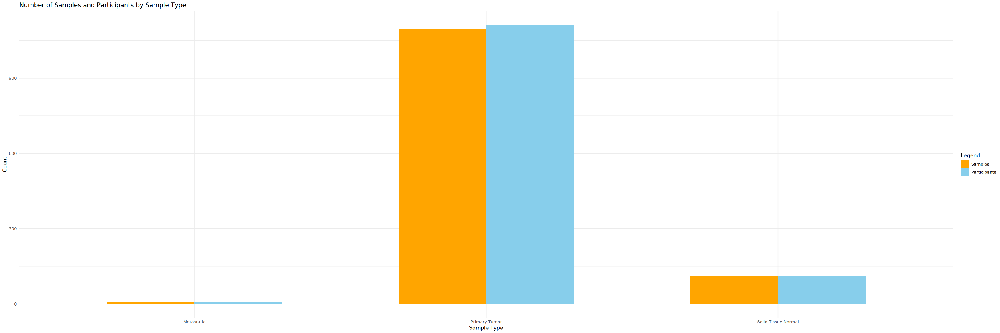

In [33]:
plot_per_cancer_cases_vs_samples(meta_data)

### Summary of Preservation Methods Across Sample Types 

In [75]:
preservation_summary <- colData(data)[, c('sample_type', 'preservation_method')] %>% 
      as_tibble() %>%
      group_by(sample_type, preservation_method) %>%
      summarise(n = n()) %>%
      arrange(preservation_method)

`summarise()` has grouped output by 'sample_type'. You can override using the
`.groups` argument.


In [76]:
preservation_summary

sample_type,preservation_method,n
<chr>,<chr>,<int>
Primary Tumor,FFPE,16
Metastatic,OCT,3
Primary Tumor,OCT,679
Solid Tissue Normal,OCT,67
Metastatic,Unknown,4
Primary Tumor,Unknown,416
Solid Tissue Normal,Unknown,46


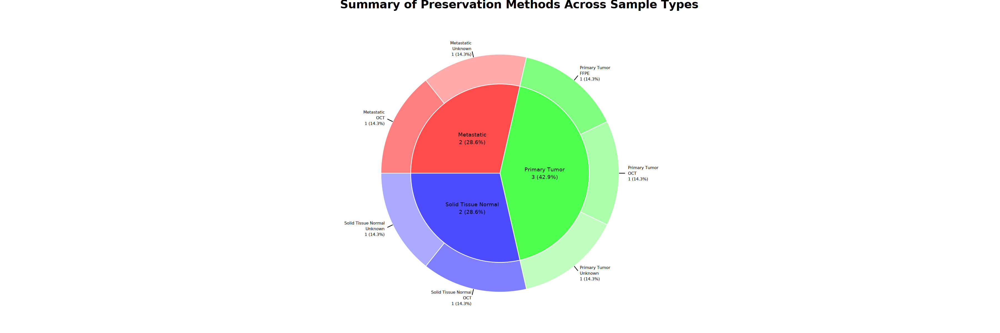

In [80]:
plot <- preservation_summary %>%
  ggiraphExtra::ggPieDonut(
    ggplot2::aes(pies = sample_type, donuts = preservation_method),
    interactive = FALSE
  ) +
  ggplot2::labs(title = "Summary of Preservation Methods Across Sample Types") +
  theme(plot.title = element_text(size = 24, face = "bold"))
plot %>% change_label(plot = .)

>  FFPE preservation is exclusively used for Primary Tumor samples, with only 16 samples recorded. Additionally, OCT is predominantly used for Primary Tumor samples (679), while only 3 Metastatic samples are available. Notably, there are significant counts of Primary Tumor (416) and Solid Tissue Normal (46) samples with an Unknown preservation method.

In [78]:
get_object_size()

Object,Size
<chr>,<chr>
data,2596.1 Mb
brca_count,290.2 Mb
change_label,0.1 Mb
meta_data,0.1 Mb
plot,0.1 Mb
plot_per_cancer_cases_vs_samples,0.1 Mb
plot_Preservation_Method_Distribution,0.1 Mb
summarize_preservation_methods,0.1 Mb


In [83]:
rm(plot,change_label,summarize_preservation_methods,plot_Preservation_Method_Distribution,plot_per_cancer_cases_vs_samples)

In [84]:
# No need for data, will be removed
rm(data)
get_object_size()

Object,Size
<chr>,<chr>
brca_count,290.2 Mb
get_object_size,0.1 Mb
meta_data,0.1 Mb


### Defining batchs and colors

Before proceeding with the analysis, we will define a set of colors for each batch to ensure clarity in visualizations. To accommodate colorblindness, we will use the Okabe-Ito palette, recommended by Okabe & Ito (2008). This palette is the default in base R (version 4.0.0 and later) and is widely recognized for its accessibility and effectiveness in presenting results to a broad audience.

In addition to the Okabe-Ito palette, other colors were carefully selected and tested using the "Let's get color blind" plugin. This tool simulates color deficiency based on the model by Gustavo M. Machado et al. ("A Physiologically-based Model for Simulation of Color Vision Deficiency," IEEE Transactions on Visualization and Computer Graphics, 2009), ensuring accessibility for individuals with color vision deficiencies.

First, let's assign colors for each sample type:

In [142]:
#get batchs, with colors by batch
batchs<- get_batchs(meta_data, cancer_id)

The `get_batchs` function processes the metadata containing cancer sample information, extracting batch-related details from the sample **barcodes**, assigning colors based on sample types, tissue sample site and other attributes, and returning a `data.table` with these enhancements. Check the [TCGA Barcode web page](https://docs.gdc.cancer.gov/Encyclopedia/pages/TCGA_Barcode/) for mor information about Barcode Reading.
Here is the schema used for the Creating Barcodes process:


<img src="https://docs.gdc.cancer.gov/Encyclopedia/pages/images/creating_barcodes.png" alt="creating_barcodes" style="display: block; margin-left: auto; margin-right: auto;"/>

We primarily utilized the following figure to enhance our understanding of barcodes. It clarifies how metadata identifiers are integrated within a barcode and provides guidance on reading these barcodes.  

<img src="https://docs.gdc.cancer.gov/Encyclopedia/pages/images/barcode.png" alt="barcode_reading" style="display: block; margin-left: auto; margin-right: auto;"/>

A TCGA barcode is composed of a series of identifiers, each uniquely identifying a TCGA data element.

In [145]:
levels(batchs$center)

[1] "07"

According to the [GDC TCGA Code Tables](https://gdc.cancer.gov/resources-tcga-users/tcga-code-tables/center-codes), the code `07` corresponds to the following center:

- **Center Name**: University of North Carolina
- **Center Type**: CGCC
- **Display Name**: UNC

In [146]:
levels(batchs$plate) %>% length # by plate: The number of plates is large, making it challenging to create color-blind friendly visuals. A solution needs to be found.

[1] 45

In [147]:
levels(batchs$tss) %>% length

[1] 40

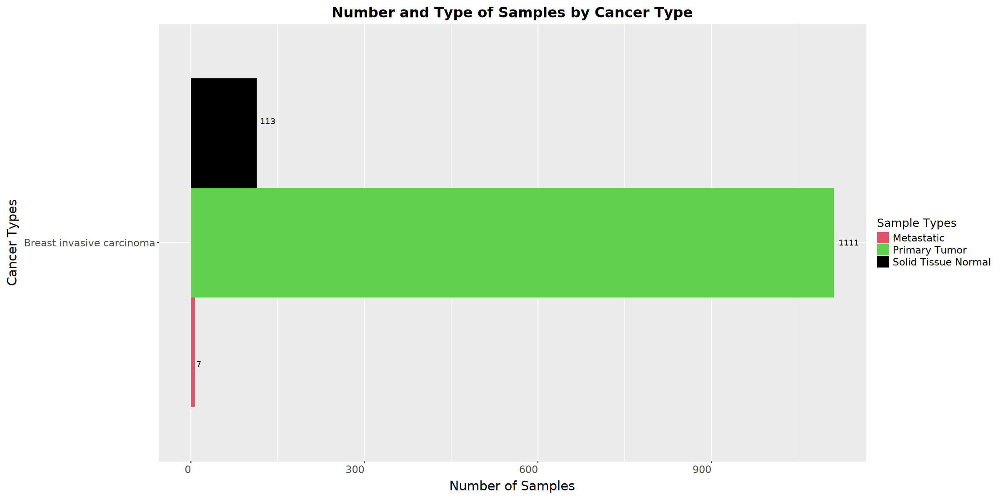

In [153]:
options(repr.plot.width = 20, repr.plot.height = 10)  # Adjust width and height as needed
plot_Samples_Cancer(batchs, cancer_names = cancer_name) %>% suppressMessages

> **⚠️ Important Notice:**
> 
> The data is **imbalanced**—the number of **Tumor samples** is significantly higher than the **Normal (or control) samples**. This imbalance may affect the analysis and should be carefully considered when interpreting the results.


In [44]:
get_object_size() %>% head

,Object,Size
,<chr>,<chr>
1,countdata_list,1613.7 Mb
2,batchs,2 Mb
3,metadata_list,0.7 Mb
4,get_batchs,0.2 Mb
5,change_label,0.1 Mb
6,check_and_install,0.1 Mb


### Data selection

In this section, I will outline the criteria for selecting the data to retain and those to discard. Based on previous analyses of the 12 cancers, we observed significant insights regarding the usage of plates. Notably, 78 out of 178 plates were utilized across multiple cancer types, while 33 out of 45 plates were specifically used for BRCA in conjunction with other cancer types. These findings may guide the data selection process.

The first step in the data selection process involves filtering the dataset to retain only paired data, which consists of 113 samples. This ensures that our analysis focuses on well-matched sample pairs, enhancing the statistical power.

In [155]:
# Filter the data keeping only  paired data 113 samples 
paired_patients <- batchs %>% dplyr::select(c(participant, groups)) %>% unique() %>% filter(duplicated(participant)) %>% .$participant

In [157]:
paired_patients %>% length

[1] 113

In [159]:
brca_batchs_paired <- batchs %>% filter(participant %in% paired_patients)

In [160]:
brca_batchs_paired %>% filter(participant %in% as.character(brca_batchs_paired %>% filter(sample_type =="Metastatic") %>% .$participant) &
                             groups =="Tumor") %>% dplyr::select( barcode, sample_type, participant) %>% arrange(participant)

,barcode,sample_type,participant
,<chr>,<fct>,<fct>
TCGA-E2-A15K-01A-11R-A12P-07,TCGA-E2-A15K-01A-11R-A12P-07,Primary Tumor,A15K
TCGA-E2-A15K-06A-11R-A12P-07,TCGA-E2-A15K-06A-11R-A12P-07,Metastatic,A15K
TCGA-BH-A18V-01A-11R-A12D-07,TCGA-BH-A18V-01A-11R-A12D-07,Primary Tumor,A18V
TCGA-BH-A18V-06A-11R-A213-07,TCGA-BH-A18V-06A-11R-A213-07,Metastatic,A18V
TCGA-BH-A1FE-01A-11R-A13Q-07,TCGA-BH-A1FE-01A-11R-A13Q-07,Primary Tumor,A1FE
TCGA-BH-A1FE-06A-11R-A213-07,TCGA-BH-A1FE-06A-11R-A213-07,Metastatic,A1FE


>As we can see in the table above, the metastatic patients also have samples from the primary tumor. **I will remove these samples with a metastatic profile**, as they introduce noise in the data (it was showed by a PCA), and there are only three such samples. We will keep other for these patients with primary tumor type

In [162]:
brca_batchs_paired <- brca_batchs_paired %>% filter(sample_type !="Metastatic")

In [163]:
brca_count_paired <- brca_count %>% dplyr::select(all_of(c("rn",brca_batchs_paired$barcode)))

In [164]:
brca_batchs_paired <-droplevels(brca_batchs_paired)

In [165]:
brca_batchs_paired$sample_type %>%table

.
      Primary Tumor Solid Tissue Normal 
                119                 113 

In [166]:
mypca_brca = mixOmics::pca(t(brca_count_paired[,-1]), ncomp = 5, center = FALSE, scale = FALSE)

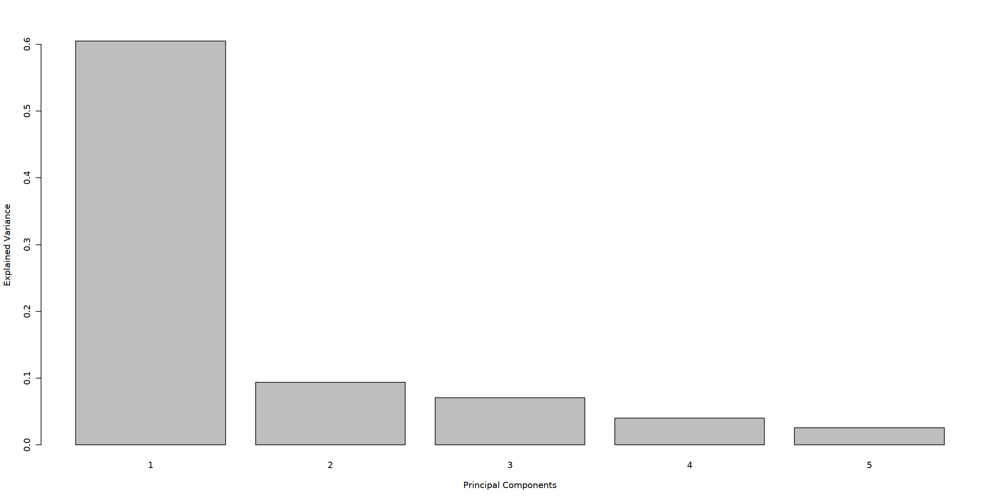

In [167]:
plot(mypca_brca)

>PC1 captures the majority of variance (>60%), indicating a strong underlying factor influencing the dataset. PC2 explains around 10%, with subsequent components (PC3 and beyond) contributing progressively less. This suggests that most of the variability in the BRCA cancer data can be captured by the first two principal components, while further PCs add minimal additional variance.

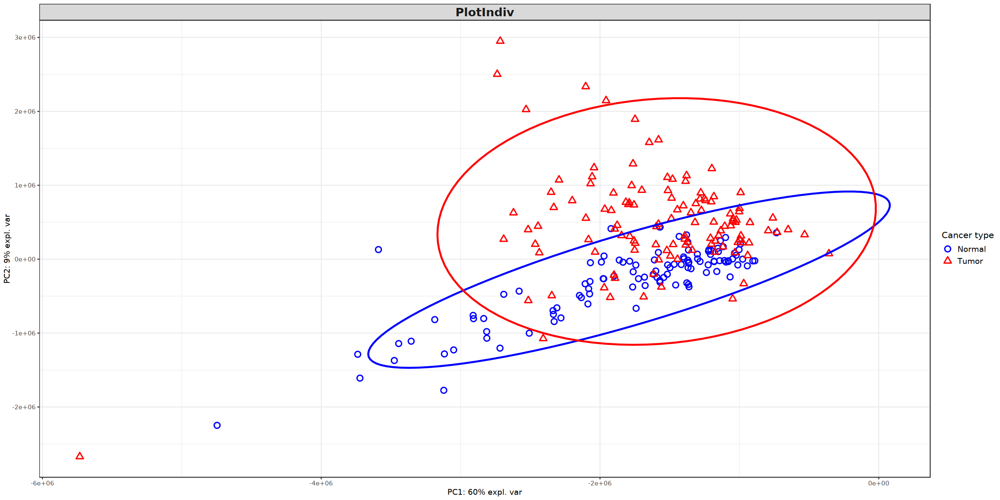

In [168]:
p1<-plotIndiv(mypca_brca, comp = 1:2, col.per.group = levels(brca_batchs_paired$c_by_group), ind.names = 
              FALSE,
          group = brca_batchs_paired$groups,
          # graphical parameters
              style = "ggplot2",
          legend = TRUE, legend.position = "right", 
          legend.title = "Cancer type", 
          legend.title.pch = 'Sample types',              
          legend.pch = FALSE,  # Show point shape in the legend
          ellipse = TRUE, 
          ellipse.level = 0.95)

The PCA figure illustrates that the raw data for tumor and control groups overlap significantly, indicating a lack of clear differentiation. This suggests that further preprocessing and cleaning of the data are necessary to enhance the visibility of group distinctions and improve the effectiveness of downstream analyses.

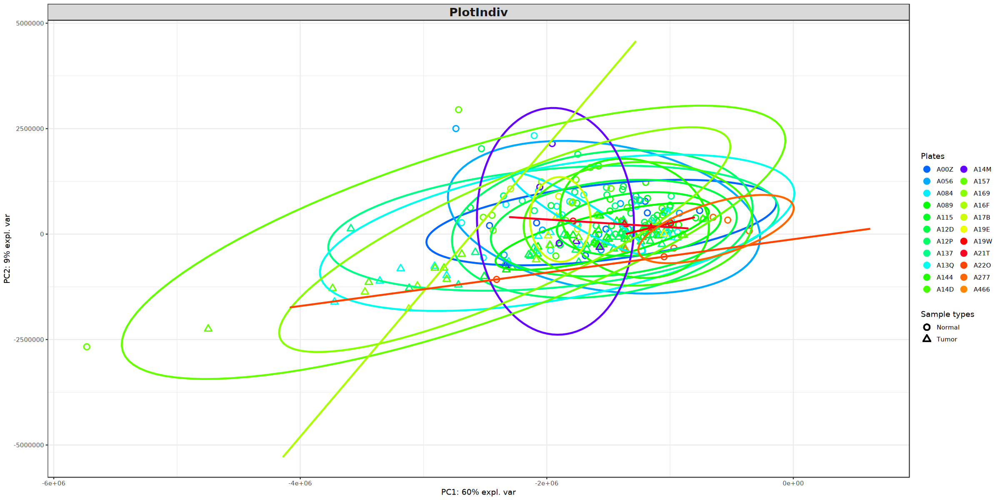

In [170]:
p1<-plotIndiv(mypca_brca, comp = 1:2, col.per.group = levels(brca_batchs_paired$c_by_plate),
          pch= brca_batchs_paired$groups,
          group = brca_batchs_paired$plate,
          # graphical parameters
              style = "ggplot2",
          legend = TRUE, legend.position = "right", 
          legend.title = "Plates", 
          legend.title.pch = 'Sample types',
          legend.pch = FALSE,  # Show point shape in the legend
          ellipse = TRUE, 
          ellipse.level = 0.95)

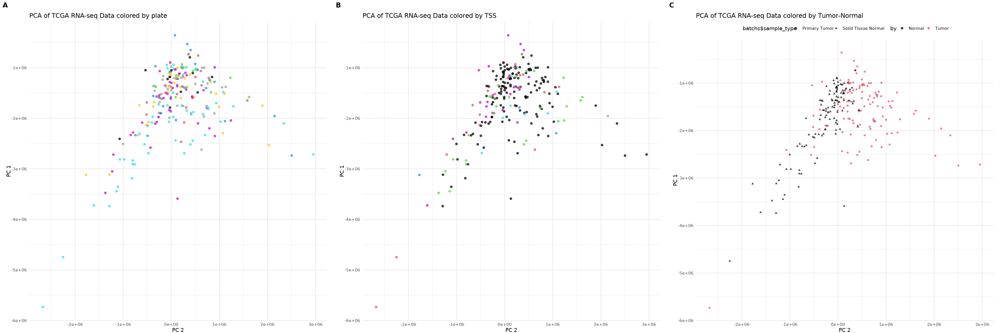

In [180]:
pca_unscaled_uncenterd_brca_count <- prcomp(t(brca_count_paired[,-1]), scale = F, center = F)
plot_PCAs(as.data.table(pca_unscaled_uncenterd_brca_count$x), brca_batchs_paired)

### Quality control
#### Normalization TMM

In [181]:
# Normalization
dge_brca <- do_normalization(brca_count_paired,brca_batchs_paired,method ="TMM", group_col = "sample_type") 
# Log-transformation
logCPM_brca <- cpm(dge_brca, log=TRUE)

In [182]:
rownames(logCPM_brca)<- dge_brca$rn

In [183]:
logCPM_brca <- as.data.table(logCPM_brca, keep.rownames = T)

#### Outliers detection

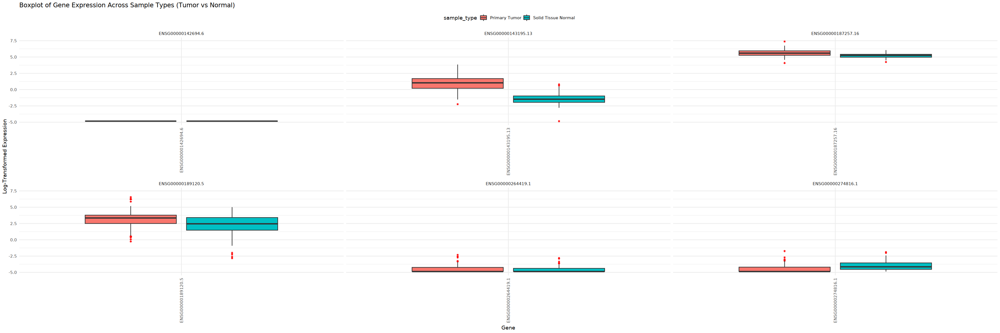

In [187]:
# Boxplot of Randomly selected gene expression across sample types (Tumor vs Normal)
# (I have changed the seed and run it several time ...)
set.seed(1026) # For reproducibility
selected_genes <- sample(logCPM_brca$rn, 6)
# Reshape for ggplot (convert to long format)
logCPM_brca_long <- melt(logCPM_brca,id.vars = "rn", variable.name = "Sample", value.name = "Expression") %>%
    mutate(sample_type= brca_batchs_paired$sample_type[Sample])

ggplot(logCPM_brca_long %>% filter(rn %in% selected_genes) , aes(x = rn, y = Expression, fill = sample_type)) +
  geom_boxplot(outlier.colour = "red", outlier.shape = 8, outlier.size = 1) +
  labs(title = "Boxplot of Gene Expression Across Sample Types (Tumor vs Normal)",
       x = "Gene",
       y = "Log-Transformed Expression") +
  facet_wrap(~rn, scales = "free_x") +  # Divide the plot into Tumor and Normal panels
  theme_minimal() +
  theme(legend.position = "top",
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust = 1))  # Rotate gene names for readability

#### Trunction at the 99th percentile: a mild way of reducing outliers impact

Truncation at the 99th percentile can partially address outlier removal, but it’s not strictly considered the same as formal outlier removal.
To remove outliers from the data, we can use the Interquartile Range (IQR) method or other approaches to filter out values considered outliers. Typically, outliers are defined as values that are above Q3+1.5×IQRQ3+1.5×IQR or below Q1−1.5×IQRQ1−1.5×IQR, where Q1 and Q3 are the first and third quartiles, respectively, and IQR is the interquartile range (Q3−Q1Q3−Q1).Generaly, outlier removal technics involves completely excluding values that are significantly different from the rest of the data (using statistical methods or visual inspection).
In other hand, truncation at the 99th percentile means capping all values above the 99th percentile to the value at the 99th percentile, which reduces the influence of extreme values. It does not remove the data points entirely, but instead limits their impact on further analysis.
For this breast cancer data, we will **truncate the values at the 99th percentile** as a mild way of reducing the impact of extreme values, without treating them as outliers or eliminating them as the IQR method does.

In [188]:
logCPM_brca_99 <- truncate_at_percentile(logCPM_brca[, -1], truncation_percentil = 0.99)
rownames(logCPM_brca_99) <- logCPM_brca$rn
logCPM_brca_99 <- as.data.table(logCPM_brca_99, keep.rownames = T)

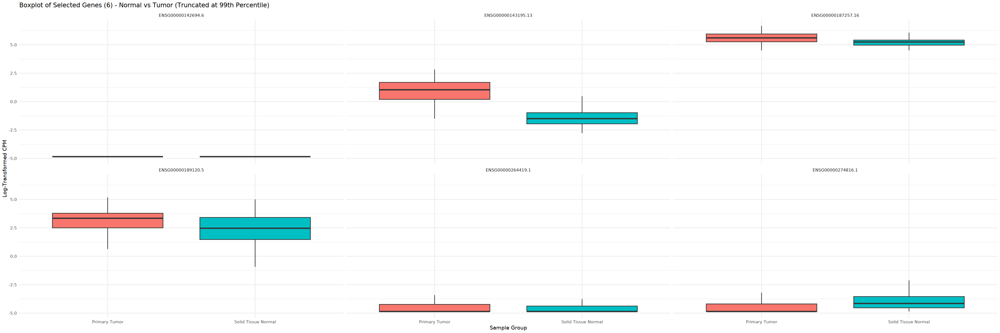

In [189]:
# Reshape for ggplot (convert to long format)
logCPM_brca_99_long <- melt(logCPM_brca_99,id.vars = "rn", variable.name = "Sample", value.name = "Expression") %>%
    mutate(sample_type= brca_batchs_paired$sample_type[Sample])
# Create a boxplot for the same selected genes divided by sample type after truncation
ggplot(logCPM_brca_99_long %>% filter(rn %in% selected_genes) , aes(x = sample_type, y = Expression, fill = sample_type)) +
  geom_boxplot(outlier.shape = NA) +  # No outliers displayed in the plot
  labs(title = "Boxplot of Selected Genes (6) - Normal vs Tumor (Truncated at 99th Percentile)",
       x = "Sample Group",
       y = "Log-Transformed CPM") +
  theme_minimal() +
  theme(legend.position = "none") +
  facet_wrap(~ rn)  # Separate plots for each gene

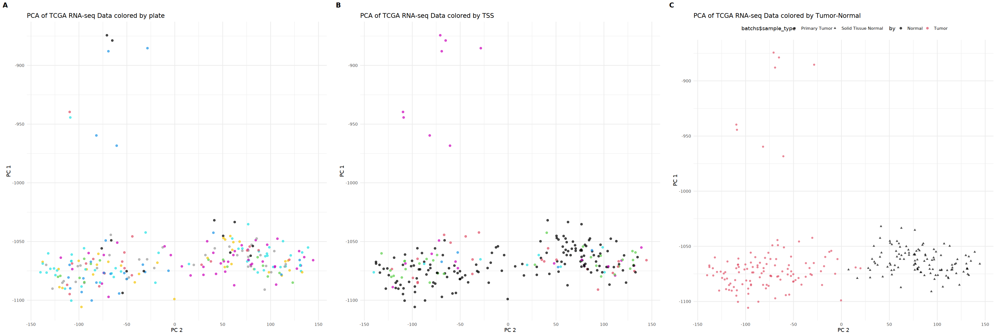

In [190]:
pca_unscaled_uncenterd_brca_normalized99 <- prcomp(t(logCPM_brca_99[,-1]), scale = F, center = F)
plot_PCAs(as.data.table(pca_unscaled_uncenterd_brca_normalized99$x), brca_batchs_paired)

The figure shows four PCA plots:
- **(A)** Colored by plate, with no clear batch effect easily detectable by eye.
- **(B)** Colored by TSS, showing no clear batch effect, but it can be observed that the 8 outlier samples all come from the same tissue site.
- **(C)** The PCA plot shows that tumor and control samples are well clustered together, indicating a clear separation between the groups. However, 8 tumor samples were detected as outliers in PC1, positioned far from the main data cluster (above -1000), suggesting potential data anomalies or batch effects that may require further investigation.

In [194]:
wiered_samples <- rownames(pca_unscaled_uncenterd_brca_normalized99$x)[which(pca_unscaled_uncenterd_brca_normalized99$x[,1] > (-1000))]
wiered_samples

[1] "TCGA-A7-A13E-01B-06R-A277-07" "TCGA-A7-A13E-01A-11R-A277-07"
[3] "TCGA-A7-A0DB-01A-11R-A277-07" "TCGA-A7-A0DB-01C-02R-A277-07"
[5] "TCGA-A7-A13G-01A-11R-A13Q-07" "TCGA-A7-A13G-01B-04R-A22O-07"
[7] "TCGA-A7-A0DC-01B-04R-A22O-07" "TCGA-A7-A0DC-01A-11R-A00Z-07"

In [195]:
# lets check their behavior in the normalized data 
logCPM_brca %>% dplyr::select(all_of(wiered_samples)) %>% head

TCGA-A7-A13E-01B-06R-A277-07,TCGA-A7-A13E-01A-11R-A277-07,TCGA-A7-A0DB-01A-11R-A277-07,TCGA-A7-A0DB-01C-02R-A277-07,TCGA-A7-A13G-01A-11R-A13Q-07,TCGA-A7-A13G-01B-04R-A22O-07,TCGA-A7-A0DC-01B-04R-A22O-07,TCGA-A7-A0DC-01A-11R-A00Z-07
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4.699873,5.0921496,5.7039145,4.5904405,5.591442,3.93900229,3.807059,6.014709
-1.101221,-0.7961921,0.1991546,-0.2220211,-1.376363,-0.06550389,-1.853107,-1.966826
4.189540,5.4159087,4.7442972,3.2622698,4.421612,3.05446263,3.837242,5.584697
4.332984,5.1623523,5.3688905,5.0701664,6.247269,5.67310459,4.282318,4.735253
3.862453,4.3591536,4.0085753,3.9825512,4.201083,3.51975195,2.733943,3.650863
1.416184,1.7480988,4.3290317,1.2218983,1.490362,2.16044596,2.170087,0.718840


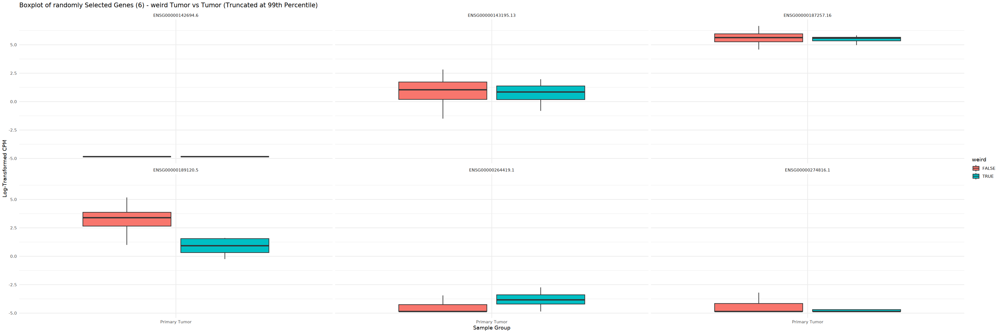

In [196]:
# Create a boxplot for the same selected genes divided by sample type after truncation
ggplot(logCPM_brca_99_long %>% filter(rn %in% selected_genes & sample_type == "Primary Tumor") %>% mutate(weird = Sample %in% wiered_samples) ,
       aes(x = sample_type, y = Expression, fill = weird)) +
  geom_boxplot(outlier.shape = NA) +  # No outliers displayed in the plot
  labs(title = "Boxplot of randomly Selected Genes (6) - weird Tumor vs Tumor (Truncated at 99th Percentile)",
       x = "Sample Group",
       y = "Log-Transformed CPM") +
  theme_minimal() +
  facet_wrap(~ rn)  # Separate plots for each gene

**⚠️ Note:**
We have noticed earlier that some samples are duplicated. Let's revisit and check if there is an intersection between the duplicated tumor samples and these weird tumor samples.

In [197]:
brca_batchs_paired %>% filter(groups =="Tumor" ) %>% 
    filter(duplicated(participant)| duplicated(participant,fromLast = T)) %>% arrange(participant) %>% .$participant %>% unique

[1] A0DB A0DC A13E A13G
113 Levels: A0AU A0AY A0AZ A0B3 A0B5 A0B7 A0B8 A0BA A0BC A0BJ A0BM A0BQ ... A2FM

In [198]:
wiered_participants <-brca_batchs_paired %>% filter(barcode %in% wiered_samples) %>% arrange(participant) %>% .$participant %>% unique
wiered_participants

[1] A0DB A0DC A13E A13G
113 Levels: A0AU A0AY A0AZ A0B3 A0B5 A0B7 A0B8 A0BA A0BC A0BJ A0BM A0BQ ... A2FM

>We can clearly see that these weird samples come from participants who provided two or more samples from the same tumor tissue sites.

In [199]:
brca_batchs_paired$tss %>% table

.
 A7  AC  BH  E2  E9  GI 
 22   8 146  22  30   4 

>The comun thing between these samples that are coming from A7 tss , according to  [TCGA](https://gdc.cancer.gov/resources-tcga-users/tcga-code-tables/tissue-source-site-codes) is Christiana Healthcare source site and from the study named "Breast invasive carcinoma", with a BCR: NCH.

**Hypothesis about these samples:** The issue may be with these specific participants, and we might need to remove their corresponding control samples as well. Could this be due to a potential batch effect? Let’s take a closer look at these participants.

In [200]:
brca_batchs_paired %>%filter(participant %in%  (brca_batchs_paired %>% filter(barcode %in% wiered_samples) %>% .$participant %>% unique)) %>%
    arrange(plate, participant,sampleVial,portionAnalyte )%>% mutate(weird = barcode %in% wiered_samples) %>% dplyr::select(participant, sampleVial,portionAnalyte,plate, groups, weird)

,participant,sampleVial,portionAnalyte,plate,groups,weird
,<fct>,<fct>,<fct>,<fct>,<fct>,<lgl>
TCGA-A7-A0DB-01A-11R-A00Z-07,A0DB,01A,11R,A00Z,Tumor,FALSE
TCGA-A7-A0DC-01A-11R-A00Z-07,A0DC,01A,11R,A00Z,Tumor,TRUE
TCGA-A7-A0DB-11A-33R-A089-07,A0DB,11A,33R,A089,Normal,FALSE
TCGA-A7-A0DC-11A-41R-A089-07,A0DC,11A,41R,A089,Normal,FALSE
TCGA-A7-A13E-01A-11R-A12P-07,A13E,01A,11R,A12P,Tumor,FALSE
TCGA-A7-A13E-11A-61R-A12P-07,A13E,11A,61R,A12P,Normal,FALSE
TCGA-A7-A13G-01A-11R-A13Q-07,A13G,01A,11R,A13Q,Tumor,TRUE
TCGA-A7-A13G-11A-51R-A13Q-07,A13G,11A,51R,A13Q,Normal,FALSE
TCGA-A7-A0DC-01B-04R-A22O-07,A0DC,01B,04R,A22O,Tumor,TRUE


#### Possible Problems with outlier samples captured by PCA

The issue likely stems from **batch effects** or **technical variability** associated with specific experimental conditions. All the "weird" samples (marked as `TRUE`) share common features, such as being processed on the same plates (A277, A22O, A13Q). This suggests that the **plate or sample processing conditions** may have introduced **systematic differences** that cause these samples to cluster separately in PCA analysis.

>- The problem is likely **technical artifacts** or **batch effects** tied to specific plates or conditions rather than biological differences.
>- Addressing this may involve **batch correction** methods (e.g., COMBAT) or removing these samples if they cannot be corrected adequately.


In [201]:
brca_batchs_paired %>% arrange(plate) %>% .$plate %>%table

.
A00Z A056 A084 A089 A115 A12D A12P A137 A13Q A144 A14D A14M A157 A169 A16F A17B 
   7   14    3   22   10   32   30   14   30   12   10    6   18    6    2    4 
A19E A19W A21T A22O A277 A466 
   1    2    2    2    4    1 

>**Plates 277, A22O  have only these wiered samples!**

In our previous data analysis of the 12 cancers, we observed that the **"A22O"** plate was exclusively used in the BRCA project.

### Data re-selection
Considering that these samples are causing significant noise in our data, we have decided to remove the data from these 4 patients. This decision is based on the need to minimize the impact of these outliers and reanalyze the study. 

In [203]:
wiered_participants

[1] A0DB A0DC A13E A13G
113 Levels: A0AU A0AY A0AZ A0B3 A0B5 A0B7 A0B8 A0BA A0BC A0BJ A0BM A0BQ ... A2FM

After removing these participants, the dataset will consist of:

- Primary Tumor: 109
- Solid Tissue Normal: 109

In [204]:
brca_batchs_paired %>% filter(!participant %in% wiered_participants) %>% .$sample_type %>% table

.
      Primary Tumor Solid Tissue Normal 
                109                 109 

In [205]:
brca_batchs_paired <- brca_batchs_paired %>% filter(!participant %in% wiered_participants)
brca_batchs_paired <-droplevels(brca_batchs_paired)
brca_count_paired <- brca_count %>% dplyr::select(all_of(c("rn",brca_batchs_paired$barcode)))

In [206]:
dim(brca_count_paired[,-1])

[1] 60660   218

In [207]:
dim(brca_batchs_paired)

[1] 218  15

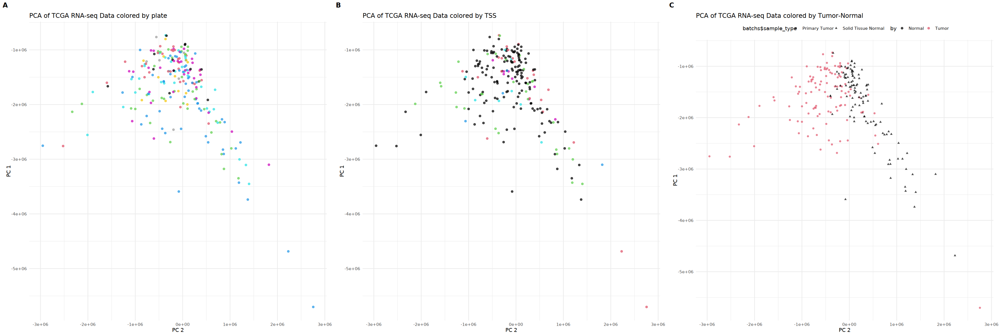

In [209]:
pca_unscaled_uncenterd_brca_count_paired <- prcomp(t(brca_count_paired[,-1]), scale = F, center = F)
plot_PCAs(as.data.table(pca_unscaled_uncenterd_brca_count_paired$x), brca_batchs_paired)

### Filter Lowly Expressed Genes (adapted to our Pathway Activity analysis approache)

In this analysis, filtering out lowly expressed genes has been adapted. Unlike differential expression analysis pipelines, where removing such genes is common, the mechanistic modeling approach utilized here requires the retention of all available data. If lowly expressed genes were excluded, the method would artificially impute missing values (e.g., using 0.5 or another value), which woucommon_genesEdgeRld not accurately represent the biological reality of low expression. Retaining these genes ensures that the model reflects true biological conditions.

In [110]:
# TODO :
#- Get  metabolized genes ! as well 
#-enhance the venn diagram : only 1 for three of them 

In [210]:
#Get hipathia Ensemble genes
hipathia_genes_table <- get_hipathia_ens_genes()
hipathia_genes<-hipathia_genes_table$ensembl_gene_id_version %>% unique

In [219]:
#identify low Expressed genes 
genes0<-rowSums(brca_count_paired[,-1]) 
genes0<-which( genes0 ==0) %>% brca_count_paired[.,1] %>% .$rn

In [220]:
# tradutiona rowSums Vs sofstiucated filterByExpr: TODO: compare the effect of using filterByExpr
agreedOnRemoving <- filterByExpr(DGEList(brca_count_paired[,-1]), 
                                 design = ifelse(meta_data$sample_type == "Solid Tissue Normal" ,1,0), 
                                 min.total.count = 1, min.count = 1)
agreedOnRemoving <-brca_count_paired[which(agreedOnRemoving ==0),rn]

In [221]:
setdiff(genes0,agreedOnRemoving) # all genes 0 are in genes captured with filterByExpr()

character(0)

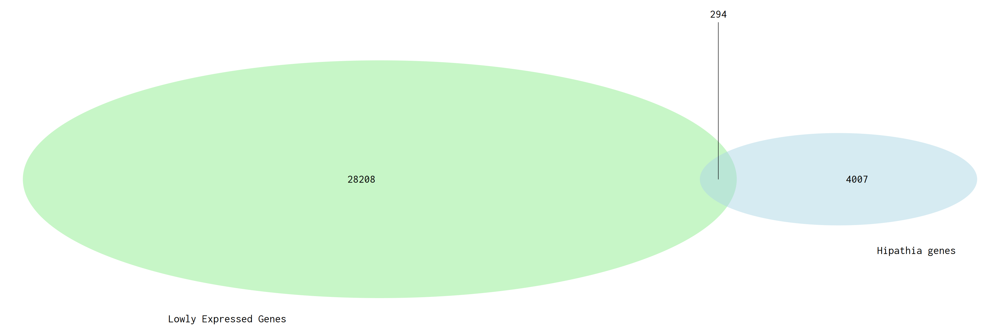

In [222]:
# Find common and unique genes: agreedOnRemoving
common_genesEdgeR <- intersect(hipathia_genes, agreedOnRemoving)
only_in_hipathiaEdgeR <- setdiff(hipathia_genes, agreedOnRemoving) ## Here I have to save it somewhere to recheck again !
only_in_genes0EdgeR <- setdiff(agreedOnRemoving, hipathia_genes)
suppressMessages(do_venn_diagram(hipathia_genes, agreedOnRemoving)) %>% grid.draw(.)

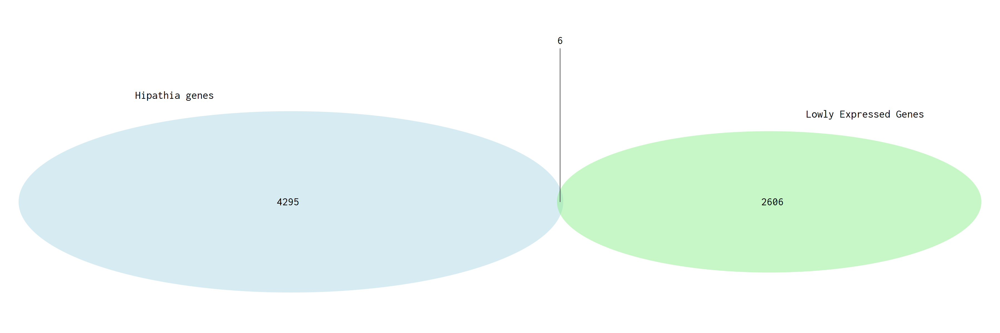

In [215]:
# Find common and unique genes: genes0
common_genes <- intersect(hipathia_genes, genes0)
only_in_hipathia <- setdiff(hipathia_genes, genes0) ## Here I have to save it somewhere to recheck again !
only_in_genes0 <- setdiff(genes0, hipathia_genes)
suppressMessages(do_venn_diagram(hipathia_genes, genes0)) %>% grid.draw(.)

Great! The intersection between the lowly expressed genes across all cancers and Hipathia is **6 genes** using the truditional methods and **294 genes** , so we can safely remove the other **28208** genes out of 60660 genes, that have are considered genes lowly expresed between two groups.

In [226]:
hipathia_null_genes_table<-hipathia_genes_table %>% filter(ensembl_gene_id_version %in% common_genesEdgeR)

These genes will be saved to be tracked in the downstream analysis, allowing for more accurate results.

In [227]:
write.table(x = hipathia_null_genes_table, file = file.path(my_dir, paste0("brca_hipathia_null_genes_",version_of_data,".tsv")), sep = "\t", quote = F,row.names = F, col.names = T)

In [228]:
brca_count_paired <- brca_count_paired %>% filter(!rn %in% only_in_genes0EdgeR)

Principal component aalysis after low count filtering:

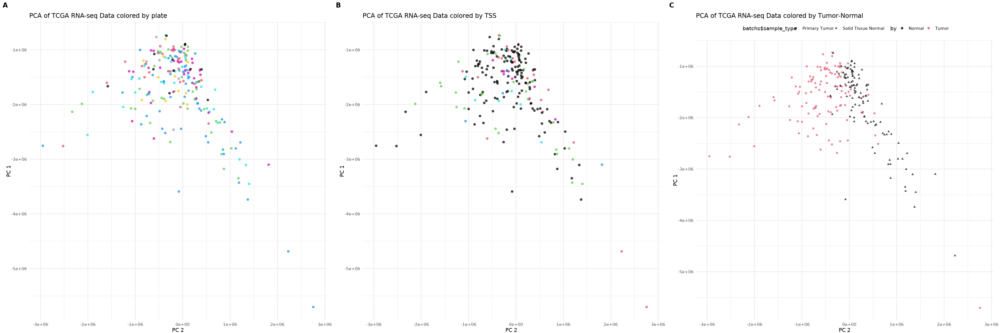

In [233]:
pca_unscaled_uncenterd_brca_count_paired <- prcomp(t(brca_count_paired[,-1]), scale = F, center = F)
plot_PCAs(as.data.table(pca_unscaled_uncenterd_brca_count_paired$x), brca_batchs_paired)

In [230]:
rm(hipathia_null_genes_table, hipathia_genes_table,only_in_hipathia, only_in_genes0, hipathia_genes, do_venn_diagram, genes0,get_info_counts)

In [231]:
get_object_size()%>%head

,Object,Size
,<chr>,<chr>
1,logCPM_brca_99_long,326.8 Mb
2,logCPM_brca_long,326.8 Mb
3,brca_count,290.2 Mb
4,logCPM_brca,112.5 Mb
5,logCPM_brca_99,112.5 Mb
6,pca_unscaled_uncenterd_brca_count,107.8 Mb


### Normalization TMM and Log-transformation

In [234]:
# Normalization
dge_brca <- do_normalization(brca_count_paired,brca_batchs_paired,method ="TMM", group_col = "sample_type") 
# Log-transformation
logCPM_brca <- cpm(dge_brca, log=TRUE)
rownames(logCPM_brca)<- dge_brca$rn
logCPM_brca <- as.data.table(logCPM_brca, keep.rownames = T)

### Trunction at the 99th percentile

In [235]:
logCPM_brca_99 <- truncate_at_percentile(logCPM_brca[, -1], truncation_percentil = 0.99)
rownames(logCPM_brca_99) <- logCPM_brca$rn
logCPM_brca_99 <- as.data.table(logCPM_brca_99, keep.rownames = T)

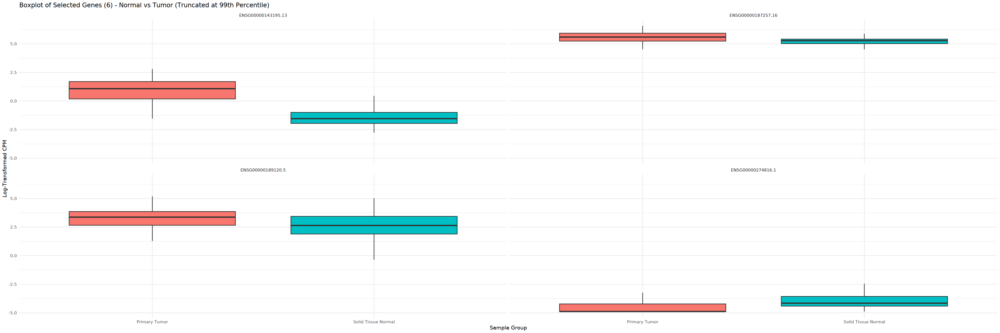

In [236]:
# Reshape for ggplot (convert to long format)
logCPM_brca_99_long <- melt(logCPM_brca_99,id.vars = "rn", variable.name = "Sample", value.name = "Expression") %>%
    mutate(sample_type= brca_batchs_paired$sample_type[Sample])
# Create a boxplot for the same selected genes divided by sample type after truncation
ggplot(logCPM_brca_99_long %>% filter(rn %in% selected_genes) , aes(x = sample_type, y = Expression, fill = sample_type)) +
  geom_boxplot(outlier.shape = NA) +  # No outliers displayed in the plot
  labs(title = "Boxplot of Selected Genes (6) - Normal vs Tumor (Truncated at 99th Percentile)",
       x = "Sample Group",
       y = "Log-Transformed CPM") +
  theme_minimal() +
  theme(legend.position = "none") +
  facet_wrap(~ rn)  # Separate plots for each gene

### Principal component analysis

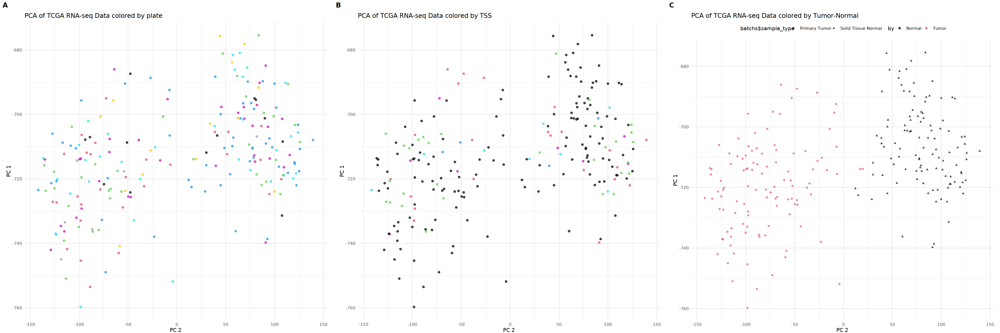

In [237]:
pca_unscaled_uncenterd_brca_normalized99 <- prcomp(t(logCPM_brca_99[,-1]), scale = F, center = F)
plot_PCAs(as.data.table(pca_unscaled_uncenterd_brca_normalized99$x), brca_batchs_paired)

In [241]:
res.pca.brca <- PCA(t(logCPM_brca_99[,-1]), graph = FALSE, ncp = 4, scale.unit = F)

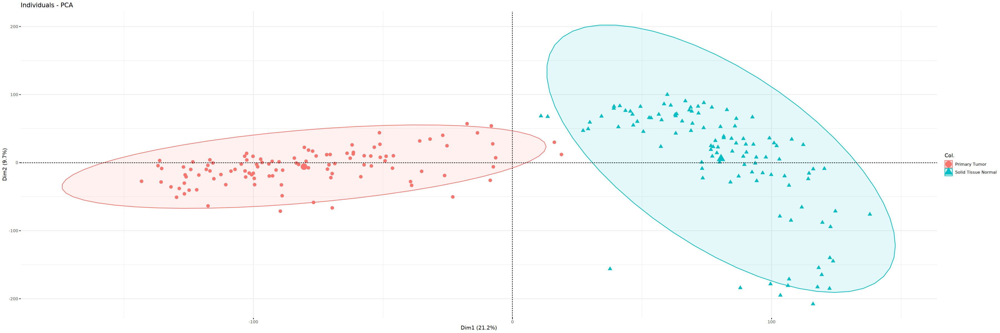

In [242]:
fviz_pca_ind(res.pca.brca, geom = "point",  pointsize = 3, addEllipses = T,
             col.ind = brca_batchs_paired$sample_type)

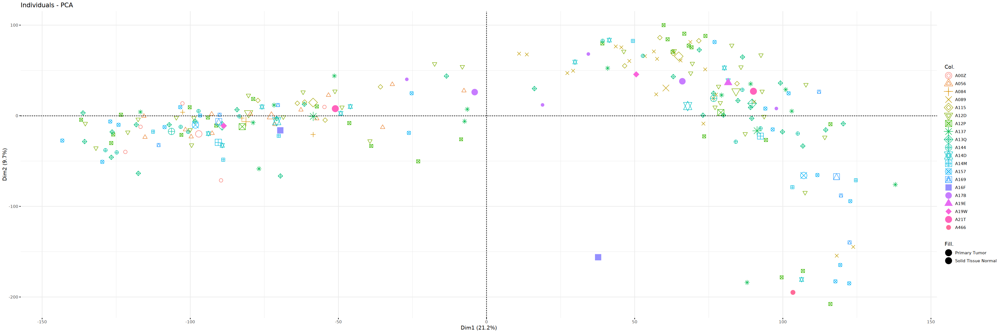

In [243]:
fviz_pca_ind(res.pca.brca, geom = "point",  pointsize = 3, addEllipses =F, ellipse.level=0.95, fill.ind = brca_batchs_paired$sample_type,
             col.ind = brca_batchs_paired$plate)

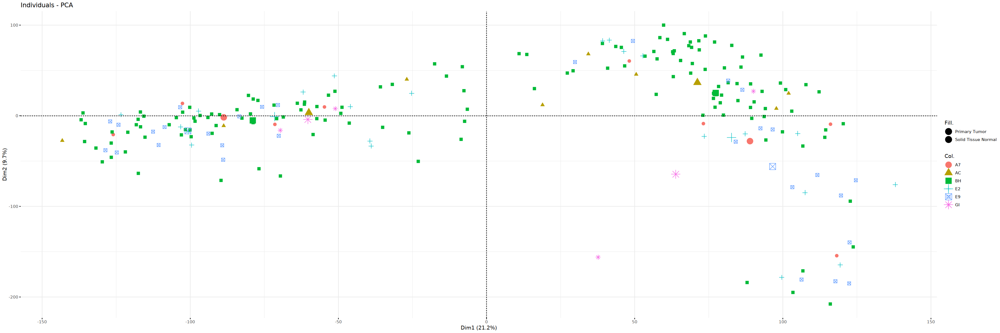

In [244]:
fviz_pca_ind(res.pca.brca, geom = "point",  pointsize = 3, addEllipses =F, ellipse.level=0.95, fill.ind = brca_batchs_paired$sample_type, 
             col.ind = brca_batchs_paired$tss)

In [245]:
# batch effect if there is : I dont concider that they are batch effect to remove ! but let have a look if data get better 

### Batch effect removal using Combat

In [246]:
my_mod_brca <-model.matrix(~as.factor(groups), data=brca_batchs_paired)
# Apply ComBat for plate BE
brca_combat4plate <- sva::ComBat(dat = logCPM_brca_99[,-1],
                 mod = my_mod_brca,
                  batch = brca_batchs_paired$plate, 
                  par.prior = TRUE, 
                  prior.plots = FALSE)

Found 2538 genes with uniform expression within a single batch (all zeros); these will not be adjusted for batch.


Using the 'mean only' version of ComBat

Found20batches

Note: one batch has only one sample, setting mean.only=TRUE

Adjusting for1covariate(s) or covariate level(s)

Standardizing Data across genes

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting the Data




In [247]:
rownames(brca_combat4plate)<-logCPM_brca_99$rn
brca_combat4plate<-as.data.table(brca_combat4plate, keep.rownames = T)

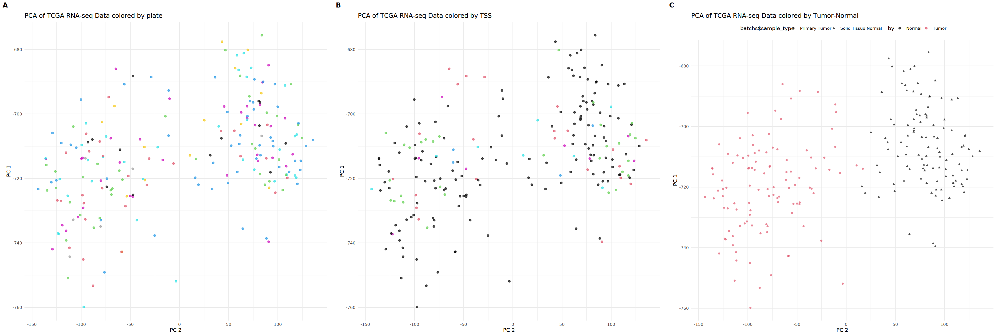

In [248]:
pca_unscaled_uncenterd_brca_combat4plate <- prcomp(t(brca_combat4plate[,-1]), scale = F, center = F)
plot_PCAs(as.data.table(pca_unscaled_uncenterd_brca_combat4plate$x), brca_batchs_paired)

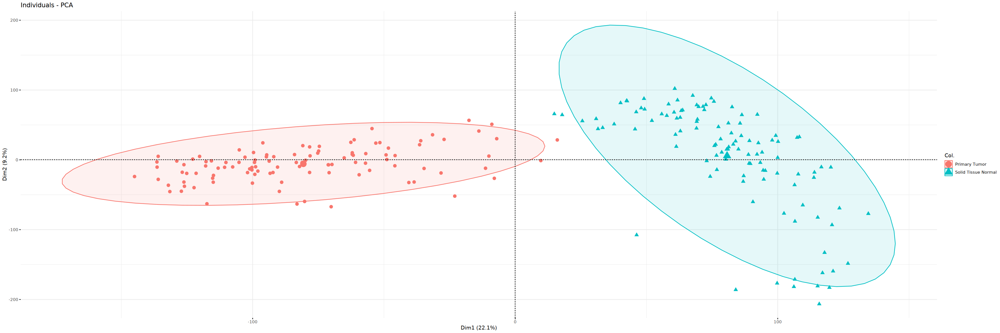

In [249]:
res.pca.brca.combat <- PCA(t(brca_combat4plate[,-1]), graph = FALSE, ncp = 4, scale.unit = F)
fviz_pca_ind(res.pca.brca.combat, geom = "point",  pointsize = 3, addEllipses = T,
             col.ind = brca_batchs_paired$sample_type)

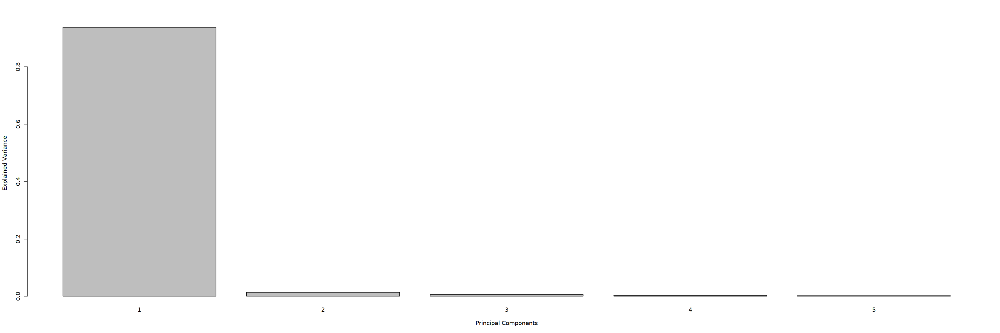

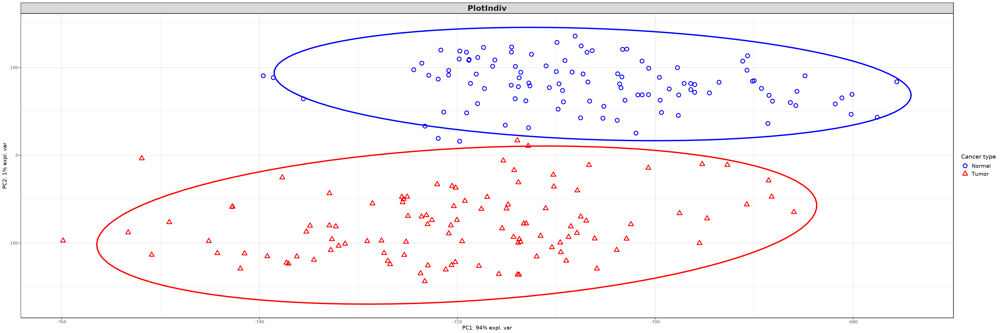

In [250]:
mypca_brca_combat = mixOmics::pca(t(brca_combat4plate[,-1]), ncomp = 5, center = FALSE, scale = FALSE)
plot(mypca_brca_combat)
plotIndiv(mypca_brca_combat, comp = 1:2, col.per.group = levels(brca_batchs_paired$c_by_group), ind.names = 
              FALSE,
          group = brca_batchs_paired$groups,
          # graphical parameters
              style = "ggplot2",
          legend = TRUE, legend.position = "right", 
          legend.title = "Cancer type", 
          legend.title.pch = 'Sample types',              
          legend.pch = FALSE,  # Show point shape in the legend
          ellipse = TRUE, 
          ellipse.level = 0.95)

>The PCA plot shows that PC1 explains 94% of the variance in the data, indicating that the first principal component captures most of the variability. This suggests that the major source of variation in our dataset is well represented by PC1, potentially reflecting a key biological or technical factor in the data.

In [ ]:
#TODO PLS,Hirarcl clustring, heat maps ...

<script src="https://cdn.plot.ly/plotly-latest.min.js"></script>

<div id="22495cec-ac95-42d5-b3b1-4566a5848585" style="height: 100%; width: 100%;" class="plotly-graph-div"></div><script type="text/javascript">window.PLOTLYENV=window.PLOTLYENV || {};window.PLOTLYENV.BASE_URL="https://plot.ly";Plotly.newPlot("22495cec-ac95-42d5-b3b1-4566a5848585", [{"type": "scatter", "x": [0.0, 0.1111111111111111, 0.2222222222222222, 0.3333333333333333, 0.4444444444444444, 0.5555555555555556, 0.6666666666666666, 0.7777777777777777, 0.8888888888888888, 1.0], "y": [-0.2706323284096669, -0.5368085060076518, -0.3650022122835297, 1.0837185699917664, -1.6123886503326845, 1.3256691068338189, -0.31083903066205104, 0.6951190301897303, -1.624361384686101, 1.852523980751262]}], {}, {"showLink": true, "linkText": "Export to plot.ly"})</script>


In [1047]:
p<-do_hc(brca_combat4plate, brca_batchs_paired)
embed_notebook(p)

<iframe src="data:text/html;charset=utf-8;base64,PCFET0NUWVBFIGh0bWw+CjxodG1sPgo8aGVhZD4KPG1ldGEgY2hhcnNldD0idXRmLTgiIC8+Cjx0aXRsZT5wbG90bHk8L3RpdGxlPgo8c2NyaXB0PihmdW5jdGlvbigpIHsKICAvLyBJZiB3aW5kb3cuSFRNTFdpZGdldHMgaXMgYWxyZWFkeSBkZWZpbmVkLCB0aGVuIHVzZSBpdDsgb3RoZXJ3aXNlIGNyZWF0ZSBhCiAgLy8gbmV3IG9iamVjdC4gVGhpcyBhbGxvd3MgcHJlY2VkaW5nIGNvZGUgdG8gc2V0IG9wdGlvbnMgdGhhdCBhZmZlY3QgdGhlCiAgLy8gaW5pdGlhbGl6YXRpb24gcHJvY2VzcyAodGhvdWdoIG5vbmUgY3VycmVudGx5IGV4aXN0KS4KICB3aW5kb3cuSFRNTFdpZGdldHMgPSB3aW5kb3cuSFRNTFdpZGdldHMgfHwge307CgogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIGEgdmlld2VyIHBhbmUuIElmIG5vdCwgd2UncmUgaW4gYSB3ZWIgYnJvd3Nlci4KICB2YXIgdmlld2VyTW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy52aWV3ZXJNb2RlID0KICAgICAgL1xidmlld2VyX3BhbmU9MVxiLy50ZXN0KHdpbmRvdy5sb2NhdGlvbik7CgogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIFNoaW55IG1vZGUuIElmIG5vdCwgaXQncyBhIHN0YXRpYyBkb2N1bWVudC4KICAvLyBOb3RlIHRoYXQgc3RhdGljIHdpZGdldHMgY2FuIGFwcGVhciBpbiBib3RoIFNoaW55IGFuZCBzdGF0aWMgbW9kZXMsIGJ1dAogIC8vIG9idmlvdXNseSwgU2hpbnkgd2lkZ2V0cyBjYW4gb25seSBhcHBlYXIgaW4gU2hpbnkgYXBwcy9kb2N1bWVudHMuCiAgdmFyIHNoaW55TW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy5zaGlueU1vZGUgPQogICAgICB0eXBlb2Yod2luZG93LlNoaW55KSAhPT0gInVuZGVmaW5lZCIgJiYgISF3aW5kb3cuU2hpbnkub3V0cHV0QmluZGluZ3M7CgogIC8vIFdlIGNhbid0IGNvdW50IG9uIGpRdWVyeSBiZWluZyBhdmFpbGFibGUsIHNvIHdlIGltcGxlbWVudCBvdXIgb3duCiAgLy8gdmVyc2lvbiBpZiBuZWNlc3NhcnkuCiAgZnVuY3Rpb24gcXVlcnlTZWxlY3RvckFsbChzY29wZSwgc2VsZWN0b3IpIHsKICAgIGlmICh0eXBlb2YoalF1ZXJ5KSAhPT0gInVuZGVmaW5lZCIgJiYgc2NvcGUgaW5zdGFuY2VvZiBqUXVlcnkpIHsKICAgICAgcmV0dXJuIHNjb3BlLmZpbmQoc2VsZWN0b3IpOwogICAgfQogICAgaWYgKHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwpIHsKICAgICAgcmV0dXJuIHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwoc2VsZWN0b3IpOwogICAgfQogIH0KCiAgZnVuY3Rpb24gYXNBcnJheSh2YWx1ZSkgewogICAgaWYgKHZhbHVlID09PSBudWxsKQogICAgICByZXR1cm4gW107CiAgICBpZiAoJC5pc0FycmF5KHZhbHVlKSkKICAgICAgcmV0dXJuIHZhbHVlOwogICAgcmV0dXJuIFt2YWx1ZV07CiAgfQoKICAvLyBJbXBsZW1lbnQgalF1ZXJ5J3MgZXh0ZW5kCiAgZnVuY3Rpb24gZXh0ZW5kKHRhcmdldCAvKiwgLi4uICovKSB7CiAgICBpZiAoYXJndW1lbnRzLmxlbmd0aCA9PSAxKSB7CiAgICAgIHJldHVybiB0YXJnZXQ7CiAgICB9CiAgICBmb3IgKHZhciBpID0gMTsgaSA8IGFyZ3VtZW50cy5sZW5ndGg7IGkrKykgewogICAgICB2YXIgc291cmNlID0gYXJndW1lbnRzW2ldOwogICAgICBmb3IgKHZhciBwcm9wIGluIHNvdXJjZSkgewogICAgICAgIGlmIChzb3VyY2UuaGFzT3duUHJvcGVydHkocHJvcCkpIHsKICAgICAgICAgIHRhcmdldFtwcm9wXSA9IHNvdXJjZVtwcm9wXTsKICAgICAgICB9CiAgICAgIH0KICAgIH0KICAgIHJldHVybiB0YXJnZXQ7CiAgfQoKICAvLyBJRTggZG9lc24ndCBzdXBwb3J0IEFycmF5LmZvckVhY2guCiAgZnVuY3Rpb24gZm9yRWFjaCh2YWx1ZXMsIGNhbGxiYWNrLCB0aGlzQXJnKSB7CiAgICBpZiAodmFsdWVzLmZvckVhY2gpIHsKICAgICAgdmFsdWVzLmZvckVhY2goY2FsbGJhY2ssIHRoaXNBcmcpOwogICAgfSBlbHNlIHsKICAgICAgZm9yICh2YXIgaSA9IDA7IGkgPCB2YWx1ZXMubGVuZ3RoOyBpKyspIHsKICAgICAgICBjYWxsYmFjay5jYWxsKHRoaXNBcmcsIHZhbHVlc1tpXSwgaSwgdmFsdWVzKTsKICAgICAgfQogICAgfQogIH0KCiAgLy8gUmVwbGFjZXMgdGhlIHNwZWNpZmllZCBtZXRob2Qgd2l0aCB0aGUgcmV0dXJuIHZhbHVlIG9mIGZ1bmNTb3VyY2UuCiAgLy8KICAvLyBOb3RlIHRoYXQgZnVuY1NvdXJjZSBzaG91bGQgbm90IEJFIHRoZSBuZXcgbWV0aG9kLCBpdCBzaG91bGQgYmUgYSBmdW5jdGlvbgogIC8vIHRoYXQgUkVUVVJOUyB0aGUgbmV3IG1ldGhvZC4gZnVuY1NvdXJjZSByZWNlaXZlcyBhIHNpbmdsZSBhcmd1bWVudCB0aGF0IGlzCiAgLy8gdGhlIG92ZXJyaWRkZW4gbWV0aG9kLCBpdCBjYW4gYmUgY2FsbGVkIGZyb20gdGhlIG5ldyBtZXRob2QuIFRoZSBvdmVycmlkZGVuCiAgLy8gbWV0aG9kIGNhbiBiZSBjYWxsZWQgbGlrZSBhIHJlZ3VsYXIgZnVuY3Rpb24sIGl0IGhhcyB0aGUgdGFyZ2V0IHBlcm1hbmVudGx5CiAgLy8gYm91bmQgdG8gaXQgc28gInRoaXMiIHdpbGwgd29yayBjb3JyZWN0bHkuCiAgZnVuY3Rpb24gb3ZlcnJpZGVNZXRob2QodGFyZ2V0LCBtZXRob2ROYW1lLCBmdW5jU291cmNlKSB7CiAgICB2YXIgc3VwZXJGdW5jID0gdGFyZ2V0W21ldGhvZE5hbWVdIHx8IGZ1bmN0aW9uKCkge307CiAgICB2YXIgc3VwZXJGdW5jQm91bmQgPSBmdW5jdGlvbigpIHsKICAgICAgcmV0dXJuIHN1cGVyRnVuYy5hcHBseSh0YXJnZXQsIGFyZ3VtZW50cyk7CiAgICB9OwogICAgdGFyZ2V0W21ldGhvZE5hbWVdID0gZnVuY1NvdXJjZShzdXBlckZ1bmNCb3VuZCk7CiAgfQoKICAvLyBBZGQgYSBtZXRob2QgdG8gZGVsZWdhdG9yIHRoYXQsIHdoZW4gaW52b2tlZCwgY2FsbHMKICAvLyBkZWxlZ2F0ZWUubWV0aG9kTmFtZS4gSWYgdGhlcmUgaXMgbm8gc3VjaCBtZXRob2Qgb24KICAvLyB0aGUgZGVsZWdhdGVlLCBidXQgdGhlcmUgd2FzIG9uZSBvbiBkZWxlZ2F0b3IgYmVmb3JlCiAgLy8gZGVsZWdhdGVNZXRob2Qgd2FzIGNhbGxlZCwgdGhlbiB

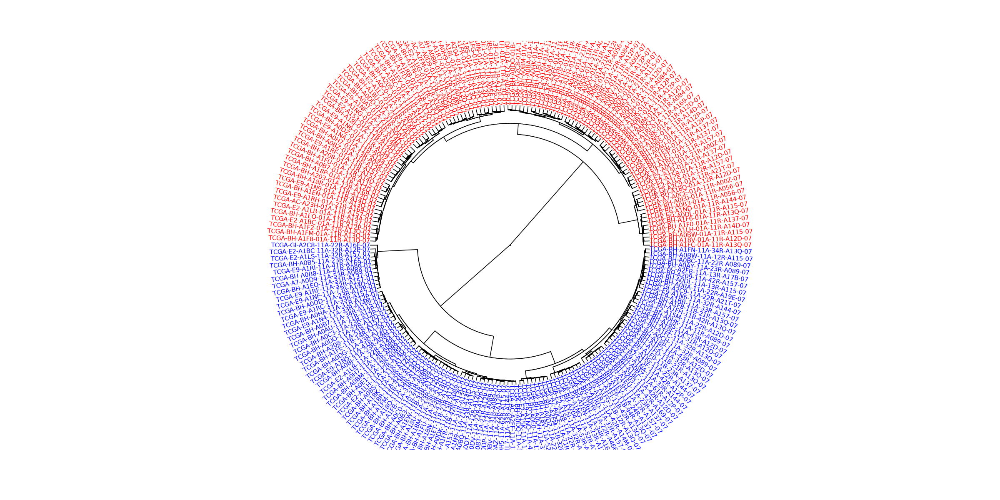

In [1038]:
plot(as.phylo(hclust(dist(t(brca_combat4plate[,-1])), "ward.D")), type = "fan", tip.color = levels(brca_batchs_paired$c_by_group)[cutree(hc, 2)],
     label.offset = 1, cex = 0.7)

>Note: Samples were classified exactly according to the real experimental design.

### save data for metabopathia

In [269]:
# Final Check : if the meta data and Gene expression data has the same samples:
all(colnames(brca_combat4plate[,-1]) %in% brca_batchs_paired$barcode) # are all in ?

[1] TRUE

In [1039]:
dim(brca_combat4plate[,-1])

[1] 32452   218

In [1040]:
brca_batchs_paired$groups %>% table

.
Normal  Tumor 
   109    109 

In [1041]:
fwrite(x = brca_combat4plate, file = file.path(my_dir, paste0("BRCA_109Nx109T_paired_normalized_trun99_combat_data_", version_of_data,".tsv")),
       quote = F, append = F, sep = "\t", 
       row.names = F, col.names = T, verbose = F)

In [1042]:
fwrite(x = brca_batchs_paired, file = file.path(my_dir, paste0("BRCA_109Nx109T_paired_metadata_", version_of_data,".tsv")),
       quote = F, append = F, sep = "\t", 
       row.names = F, col.names = T, verbose = F)

In [1043]:
# The end !

In [252]:
#TODO: Pathway enrichment analysis